In [31]:
from google.colab import drive
drive.mount("/gdrive")


Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).


In [32]:
# Set seed for reproducibility
SEED = 42

import os
import random
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

os.environ['PYTHONHASHSEED'] = str(SEED)
os.environ['MPLCONFIGDIR'] = os.getcwd() + '/configs/'

import numpy as np
np.random.seed(SEED)
random.seed(SEED)
import torch
torch.manual_seed(SEED)
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torch.utils.tensorboard import SummaryWriter
import torchvision
from torchvision import transforms
import torchvision.models as models                             ##EfficientNet

!pip install lion-pytorch                                       ##Lionoptimizer


logs_dir = "tensorboard"
os.makedirs("models", exist_ok=True)

if torch.cuda.is_available():
    device = torch.device("cuda")
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.benchmark = True
else:
    device = torch.device("cpu")

print(f"PyTorch version: {torch.__version__}")
print(f"Device: {device}")

from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix


sns.set(font_scale=1.4)
sns.set_style('white')
plt.rc('font', size=14)
%matplotlib inline


PyTorch version: 2.9.0+cu126
Device: cuda


In [33]:
current_dir = "/gdrive/My Drive/AN2DL_2chall"
train_data_dir = f"{current_dir}/train_data"
test_data_dir = f"{current_dir}/test_data"
csv_path = f"{current_dir}/train_labels.csv"

# --- FLAGS PRINCIPALE ---
GENERATE_TILES = True  # <--- Metti FALSE se hai già generato e vuoi solo trainare (non devi aver cambiato nessun parametro di tiles e validation percentage se vuoi mettere false)
GENERATE_TILES_INF = True
ELIMINATE_EXTENDED_DATASETS_AFTER = False



# Percorso Output Espanso (Unica cartella per le tiles di Train e Val)
train_expanded_dir = f"{current_dir}/train_data_expanded"
# CSV Espansi (Salviamo i risultati per poterli ricaricare)
##obsoleto########
csv_train_tiles_path = f"{current_dir}/train_data_expanded/train_tiles.csv"
csv_val_tiles_path = f"{current_dir}/train_data_expanded/val_tiles.csv"
###################

import pandas as pd
import os
import shutil
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from math import ceil
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch
from torchvision.transforms import RandAugment

# Carico le etichette
df = pd.read_csv(csv_path)
if "sample_index" not in df.columns:
    df.columns = ["sample_index", "label"]

# Filtra sample senza maschera
all_files = set(os.listdir(train_data_dir))
valid_imgs = {
    f for f in all_files
    if f.startswith("img_") and f.replace("img_", "mask_") in all_files
}

SAMPLES_TO_IGNORE = [
"img_0001.png","img_0005.png","img_0008.png","img_0012.png","img_0018.png","img_0020.png","img_0022.png","img_0027.png","img_0028.png","img_0036.png",
"img_0044.png","img_0047.png","img_0048.png","img_0052.png","img_0062.png","img_0078.png","img_0085.png","img_0090.png","img_0094.png","img_0095.png",
"img_0126.png","img_0129.png","img_0130.png","img_0133.png","img_0136.png","img_0138.png","img_0148.png","img_0150.png","img_0155.png","img_0159.png",
"img_0161.png","img_0175.png","img_0178.png","img_0179.png","img_0180.png","img_0184.png","img_0187.png","img_0189.png","img_0193.png","img_0196.png",
"img_0222.png","img_0251.png","img_0254.png","img_0263.png","img_0268.png","img_0286.png","img_0293.png","img_0313.png","img_0319.png","img_0333.png",
"img_0342.png","img_0344.png","img_0346.png","img_0355.png","img_0368.png","img_0371.png","img_0376.png","img_0380.png","img_0390.png","img_0393.png",
"img_0407.png","img_0410.png","img_0415.png","img_0424.png","img_0443.png","img_0453.png","img_0459.png","img_0463.png","img_0486.png","img_0497.png",
"img_0498.png","img_0499.png","img_0509.png","img_0521.png","img_0530.png","img_0531.png","img_0533.png","img_0537.png","img_0540.png","img_0544.png",
"img_0547.png","img_0557.png","img_0558.png","img_0560.png","img_0565.png","img_0567.png","img_0572.png","img_0578.png","img_0580.png","img_0586.png",
"img_0602.png","img_0603.png","img_0607.png","img_0609.png","img_0614.png","img_0620.png","img_0623.png","img_0629.png","img_0635.png","img_0639.png",
"img_0643.png","img_0644.png","img_0645.png","img_0646.png","img_0656.png","img_0657.png","img_0658.png","img_0670.png","img_0673.png","img_0675.png"

]


df = df[df["sample_index"].isin(valid_imgs)]
df = df[~df["sample_index"].isin(SAMPLES_TO_IGNORE)].reset_index(drop=True)
print("Sample validi dopo img+mask filter:", len(df))

# Label mapping
class_names = sorted(df["label"].unique())
label_to_index = {name: idx for idx, name in enumerate(class_names)}
df["label_index"] = df["label"].map(label_to_index)
num_classes = len(class_names)
print(f"Number of classes: {num_classes}")

# Train/validation split (stratified)
VALIDATION_PERCENTAGE = 0.15


Sample validi dopo img+mask filter: 581
Number of classes: 4


In [34]:
# Parametri Tiling
INPUT_SIZE = 192
DOWNSCALE_FACTOR = 1.4  # deve essere uguale anche dopo nell'inference
MIN_TILE_SIDE = 80      # Scarta tiles < tot px
MIN_MASK_RATIO = 0.08   # 8% di ROI minimo




# Calcolo dimensione ritaglio sorgente
SOURCE_TILE_SIZE = int(INPUT_SIZE * DOWNSCALE_FACTOR)

# ==========================================
# 2. LOGICA DI TILING (Solo Train/Val)
# ==========================================

def get_bbox(mask, padding=10):
    ys, xs = np.where(mask > 0)
    if len(xs) == 0: return None
    x1, x2 = xs.min(), xs.max()
    y1, y2 = ys.min(), ys.max()
    h, w = mask.shape
    x1 = max(0, x1 - padding)
    y1 = max(0, y1 - padding)
    x2 = min(w, x2 + padding)
    y2 = min(h, y2 + padding)
    return x1, y1, x2, y2

def split_and_save_tiles(row, src_dir, dst_dir):
    # Rimosso start_idx dagli argomenti
    img_name = row["sample_index"]
    label_idx = row["label_index"]
    label_str = row["label"]

    img_path = os.path.join(src_dir, img_name)
    mask_path = os.path.join(src_dir, img_name.replace("img_", "mask_"))

    if not os.path.exists(mask_path): return [] # Ritorna lista vuota

    original_img = np.array(Image.open(img_path).convert("RGB"))
    original_mask = np.array(Image.open(mask_path).convert("L"))

    # 1. Macro Crop
    bbox = get_bbox(original_mask, padding=20)
    if bbox is None: return []

    x1, y1, x2, y2 = bbox
    crop_img = original_img[y1:y2, x1:x2]
    crop_mask = original_mask[y1:y2, x1:x2]
    h_crop, w_crop = crop_img.shape[:2]

    # 2. Logica Tiling
    SINGLE_LIMIT = SOURCE_TILE_SIZE * 1.5

    if w_crop > h_crop: # Orizzontale
        if h_crop < SINGLE_LIMIT:
            n_splits_h = 1
            n_splits_w = max(1, int(round(w_crop / h_crop)))
        else:
            n_splits_h = max(1, int(round(h_crop / SOURCE_TILE_SIZE)))
            n_splits_w = max(1, int(round(w_crop / SOURCE_TILE_SIZE)))
    else: # Verticale
        if w_crop < SINGLE_LIMIT:
            n_splits_w = 1
            n_splits_h = max(1, int(round(h_crop / w_crop)))
        else:
            n_splits_h = max(1, int(round(h_crop / SOURCE_TILE_SIZE)))
            n_splits_w = max(1, int(round(w_crop / SOURCE_TILE_SIZE)))

    step_h = h_crop // n_splits_h
    step_w = w_crop // n_splits_w

    new_rows = []

    for i in range(n_splits_h):
        for j in range(n_splits_w):
            ty1 = i * step_h
            tx1 = j * step_w
            ty2 = (i + 1) * step_h if i < n_splits_h - 1 else h_crop
            tx2 = (j + 1) * step_w if j < n_splits_w - 1 else w_crop

            if n_splits_h > 1: ty2 = min(h_crop, ty2 + 20)
            if n_splits_w > 1: tx2 = min(w_crop, tx2 + 20)

            tile_img = crop_img[ty1:ty2, tx1:tx2]
            tile_mask = crop_mask[ty1:ty2, tx1:tx2]

            # 3. Check ROI
            if tile_mask.size == 0: continue
            roi_ratio = np.count_nonzero(tile_mask) / tile_mask.size
            if roi_ratio < MIN_MASK_RATIO: continue

            # 4. Refine Crop
            sub_bbox = get_bbox(tile_mask, padding=10)
            final_img = tile_img
            final_mask = tile_mask
            if sub_bbox:
                sx1, sy1, sx2, sy2 = sub_bbox
                if (sx2-sx1) > MIN_TILE_SIDE and (sy2-sy1) > MIN_TILE_SIDE:
                    final_img = tile_img[sy1:sy2, sx1:sx2]
                    final_mask = tile_mask[sy1:sy2, sx1:sx2]

            if final_img.shape[0] < MIN_TILE_SIDE or final_img.shape[1] < MIN_TILE_SIDE: continue

            # --- NUOVO SISTEMA DI SALVATAGGIO ---
            # Nome: img_0588_tile00.png, img_0588_tile01.png ...

            # Rimuovo estensione dal nome originale (img_0588.png -> img_0588)
            base_name = os.path.splitext(img_name)[0]

            # Indice locale progressivo per questa immagine
            tile_local_idx = len(new_rows)

            new_img_name = f"{base_name}_tile{tile_local_idx:02d}.png"

            # Anche la maschera segue la convenzione: mask_0588_tile00.png
            # Sostituiamo img_ con mask_ nel basename se presente
            base_name_mask = base_name.replace("img_", "mask_")
            new_mask_name = f"{base_name_mask}_tile{tile_local_idx:02d}.png"

            Image.fromarray(final_img).save(os.path.join(dst_dir, new_img_name))
            # Salviamo anche la maschera (utile per debug, anche se il dataset finale non la usa)
            Image.fromarray(final_mask).save(os.path.join(dst_dir, new_mask_name))

            new_rows.append({
                "sample_index": new_img_name,
                "label": label_str,
                "label_index": label_idx,
                "original_sample": img_name
            })

    return new_rows

# ==========================================
# 3. MAIN PIPELINE
# ==========================================

# A. Caricamento e Filtri
df = pd.read_csv(csv_path)
if "sample_index" not in df.columns: df.columns = ["sample_index", "label"]

all_files = set(os.listdir(train_data_dir))
valid_imgs = {f for f in all_files if f.startswith("img_") and f.replace("img_", "mask_") in all_files}
df = df[df["sample_index"].isin(valid_imgs)]
df = df[~df["sample_index"].isin(SAMPLES_TO_IGNORE)].reset_index(drop=True)
print("Sample originali validi:", len(df))

# B. Label Mapping
class_names = sorted(df["label"].unique())
label_to_index = {name: idx for idx, name in enumerate(class_names)}
df["label_index"] = df["label"].map(label_to_index)
print(f"Classes: {len(class_names)}")

# C. SPLIT TRAIN/VAL SULLE IMMAGINI ORIGINALI
train_df_orig, val_df_orig = train_test_split(
    df, test_size=VALIDATION_PERCENTAGE, stratify=df["label"], random_state=SEED
)
print(f"Original Split -> Train: {len(train_df_orig)}, Val: {len(val_df_orig)}")

if GENERATE_TILES:
    print("\n>>> STARTING TILING PROCESS (Train & Val)...")

    if os.path.exists(train_expanded_dir): shutil.rmtree(train_expanded_dir)
    os.makedirs(train_expanded_dir)

    # Train Tiles
    print("Tiling Training Set...")
    train_tiles = []
    for _, row in train_df_orig.iterrows():
        new_rows = split_and_save_tiles(row, train_data_dir, train_expanded_dir)
        train_tiles.extend(new_rows)
    train_tiles_df = pd.DataFrame(train_tiles)
    train_tiles_df.to_csv(csv_train_tiles_path, index=False)

    # Val Tiles
    print("Tiling Validation Set...")
    val_tiles = []
    for _, row in val_df_orig.iterrows():
        new_rows = split_and_save_tiles(row, train_data_dir, train_expanded_dir)
        val_tiles.extend(new_rows)
    val_tiles_df = pd.DataFrame(val_tiles)
    val_tiles_df.to_csv(csv_val_tiles_path, index=False)

    print(">>> TILING COMPLETED.")

else:
    print("\n>>> LOADING PRE-GENERATED TILES...")
    if os.path.exists(csv_train_tiles_path):
        train_tiles_df = pd.read_csv(csv_train_tiles_path)
        val_tiles_df = pd.read_csv(csv_val_tiles_path)
        print(f"Loaded CSVs: Train {len(train_tiles_df)}, Val {len(val_tiles_df)}")
    else:
        raise ValueError("GENERATE_TILES è False ma i CSV non esistono! Imposta True.")

# ==========================================
# 4. DATASET & DATALOADERS
# ==========================================

class MaskedCropDataset(Dataset):
    def __init__(self, dataframe, img_dir, transform=None):
        self.df = dataframe.reset_index(drop=True)
        self.img_dir = img_dir
        self.transform = transform

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_name = row["sample_index"]
        img_path = os.path.join(self.img_dir, img_name)
        # La tile è già croppata, la carichiamo direttamente
        image = Image.open(img_path).convert("RGB")

        if self.transform: image = self.transform(image)
        return image, row["label_index"]

    def __len__(self):
        return len(self.df)


Sample originali validi: 581
Classes: 4
Original Split -> Train: 493, Val: 88

>>> STARTING TILING PROCESS (Train & Val)...
Tiling Training Set...
Tiling Validation Set...
>>> TILING COMPLETED.


In [35]:
##//////ADVICE 3 sulla tempesta, rendo l'augmentation totalmente randomica//////////////
##########TRANSFORMS########
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

train_transform_tl = transforms.Compose([
    transforms.Resize((INPUT_SIZE, INPUT_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])


train_transform_ft = transforms.Compose([
    transforms.Resize((INPUT_SIZE, INPUT_SIZE)),
    RandAugment(num_ops=2, magnitude=2),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(15),
    transforms.ColorJitter(
        brightness=0.02,
        contrast=0.03,
        saturation=0.05,
        hue=0.05
    ),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

val_transform = transforms.Compose([
    transforms.Resize((INPUT_SIZE, INPUT_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

train_dataset = MaskedCropDataset(train_tiles_df, train_expanded_dir, transform=train_transform_tl)
val_dataset   = MaskedCropDataset(val_tiles_df,   train_expanded_dir, transform=val_transform)

def make_loader(ds, batch_size, shuffle, drop_last=False):
    cpu_cores = os.cpu_count() or 2
    num_workers = max(2, min(4, cpu_cores))
    return DataLoader(
        ds,
        batch_size=batch_size,
        shuffle=shuffle,
        drop_last=drop_last,
        num_workers=num_workers,
        pin_memory=True,
        pin_memory_device="cuda" if torch.cuda.is_available() else "",
        prefetch_factor=4,
    )

BATCH_SIZE = 64
train_loader = make_loader(train_dataset, BATCH_SIZE, shuffle=True,  drop_last=False)
val_loader   = make_loader(val_dataset,   BATCH_SIZE, shuffle=False, drop_last=False)

# Alias per le fasi di training/fine-tuning
train_tl_loader, val_tl_loader = train_loader, val_loader
train_ft_loader, val_ft_loader = train_loader, val_loader

data_transforms = val_transform



In [36]:
print(f"\n--- SETUP FINITO ---")
print(f"Train Tiles: {len(train_dataset)}")
print(f"Val Tiles:   {len(val_dataset)}")

print(f"Input tensor shape: (3, {INPUT_SIZE}, {INPUT_SIZE})")



--- SETUP FINITO ---
Train Tiles: 658
Val Tiles:   112
Input tensor shape: (3, 192, 192)


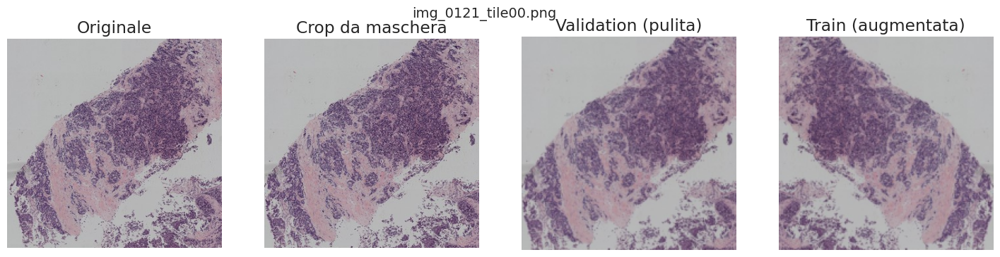

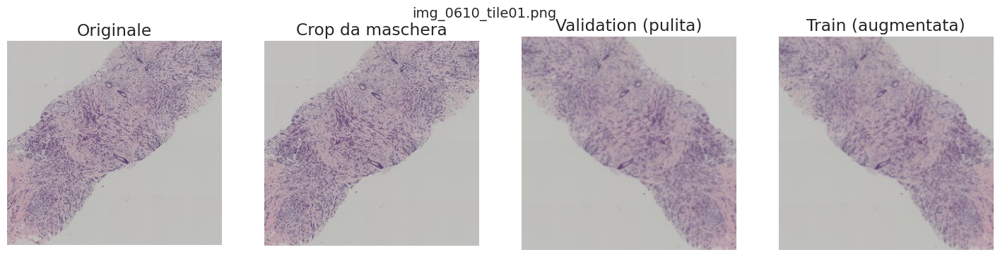

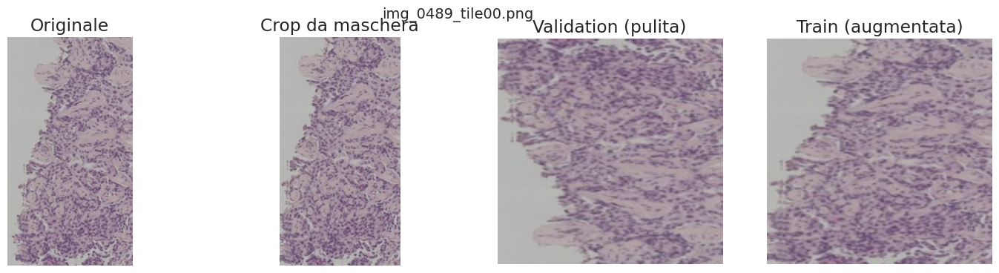

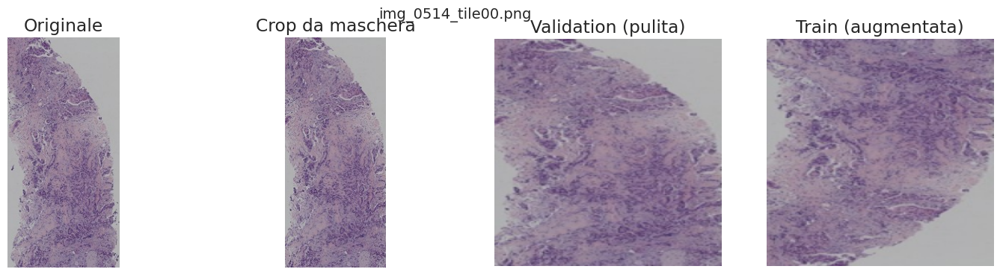

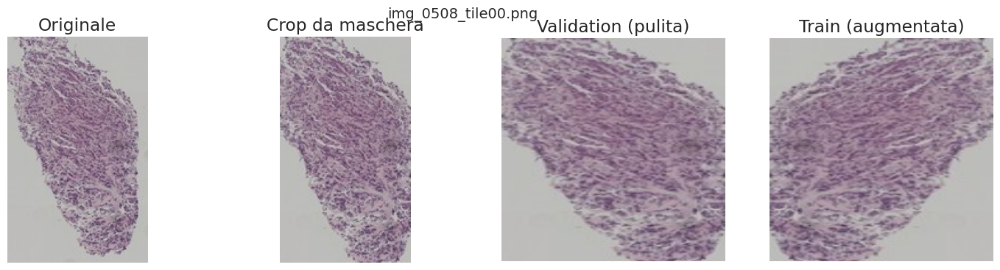

...

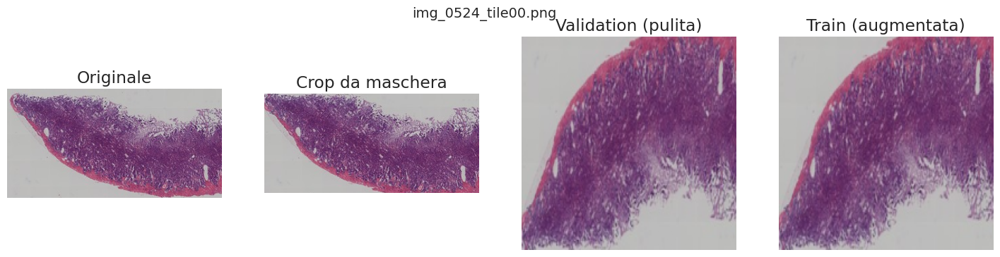

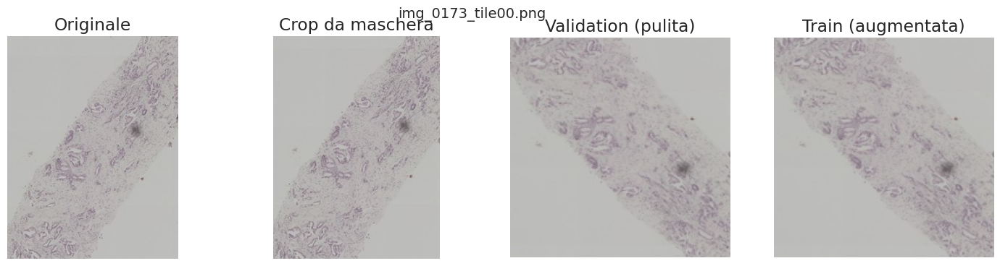

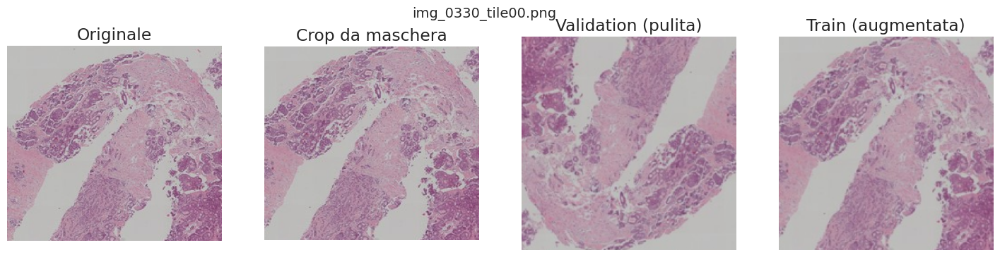

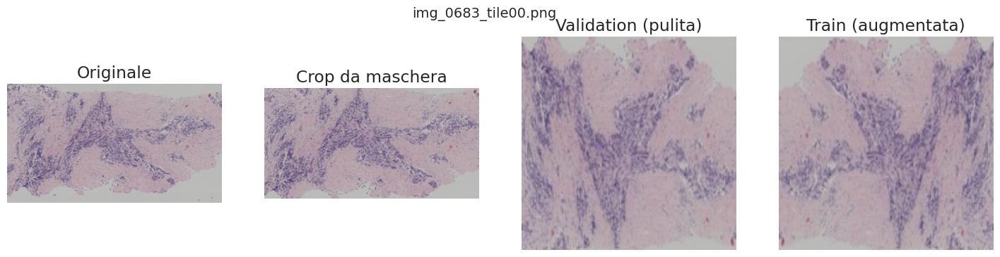

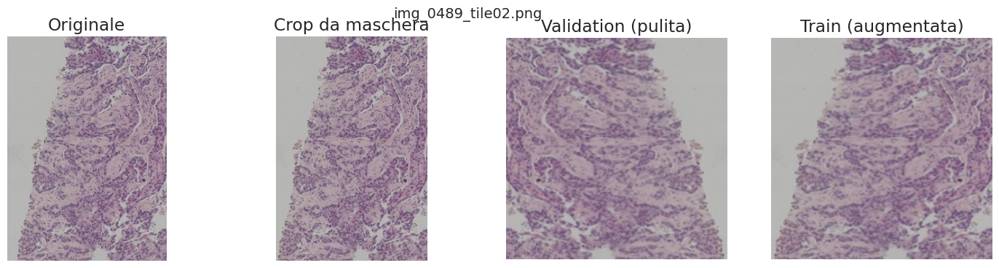

In [37]:
import random
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

def unnormalize(img, mean, std):
    img = img.copy()
    for c in range(3):
        img[c] = img[c] * std[c] + mean[c]
    return np.clip(img, 0, 1)

def show_mask_and_augment_effect(dataset, train_transform, val_transform, n=3):
    indices = random.sample(range(len(dataset)), n)

    for idx in indices:
        row = dataset.df.iloc[idx]
        img_name = row["sample_index"]
        img_path  = os.path.join(dataset.img_dir, img_name)
        mask_path = os.path.join(dataset.img_dir, img_name.replace("img_", "mask_"))

        # Load raw
        raw_img  = np.array(Image.open(img_path).convert("RGB"))
        raw_mask = np.array(Image.open(mask_path).convert("L"))

        # --- Crop with mask ---
        ys, xs = np.where(raw_mask > 0)
        if len(xs) > 0:
            x1, x2 = xs.min(), xs.max()
            y1, y2 = ys.min(), ys.max()
            crop_img = raw_img[y1:y2, x1:x2]
        else:
            crop_img = raw_img

        # Transforms
        val_img   = val_transform(Image.fromarray(crop_img))
        train_img = train_transform(Image.fromarray(crop_img))

        # Unnormalize for plotting
        val_img   = unnormalize(val_img.numpy(), IMAGENET_MEAN, IMAGENET_STD)
        train_img = unnormalize(train_img.numpy(), IMAGENET_MEAN, IMAGENET_STD)

        # Plot
        fig, axs = plt.subplots(1, 4, figsize=(18, 4))
        axs[0].imshow(raw_img)
        axs[0].set_title("Originale")

        axs[1].imshow(crop_img)
        axs[1].set_title("Crop da maschera")

        axs[2].imshow(np.transpose(val_img, (1, 2, 0)))
        axs[2].set_title("Validation (pulita)")

        axs[3].imshow(np.transpose(train_img, (1, 2, 0)))
        axs[3].set_title("Train (augmentata)")

        for ax in axs:
            ax.axis("off")

        plt.suptitle(f"{img_name}", fontsize=14)
        plt.show()


# --- USO ---
show_mask_and_augment_effect(
    dataset=train_dataset,
    train_transform=train_transform_tl,
    val_transform=val_transform,
    n=20
)


In [38]:
# Define the input shape and number of classes
input_shape = (3, INPUT_SIZE, INPUT_SIZE)
print("Input Shape:", input_shape)
print("Number of Classes:", num_classes)


Input Shape: (3, 192, 192)
Number of Classes: 4


In [39]:
# Batch size
print("Batch Size:", BATCH_SIZE)


Batch Size: 64


In [40]:
from sklearn.utils.class_weight import compute_class_weight

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.arange(num_classes),
    y=train_tiles_df["label_index"].values
)

class_weights = torch.tensor(class_weights, dtype=torch.float).to(device)

criterion = nn.CrossEntropyLoss(
    weight=class_weights,
    label_smoothing=0.05  # oppure 0.0
)

In [41]:
# Training parameters
LEARNING_RATE = 3e-4
EPOCHS = 200
PATIENCE = 20
DROPOUT_RATE = 0.35
L2_LAMBDA = 1e-3


print("Epochs:", EPOCHS)
print("Batch Size:", BATCH_SIZE)
print("Learning Rate:", LEARNING_RATE)
print("Dropout Rate:", DROPOUT_RATE)
print("Patience:", PATIENCE)
print(class_weights)



Epochs: 200
Batch Size: 64
Learning Rate: 0.0003
Dropout Rate: 0.35
Patience: 20
tensor([1.0682, 1.0154, 0.6303, 2.0309], device='cuda:0')


Training Functions


In [42]:
from sklearn.metrics import accuracy_score, f1_score

def train_one_epoch(model, train_loader, criterion, optimizer, scaler, device, l2_lambda=0):
    model.train()
    running_loss = 0.0
    all_predictions = []
    all_targets = []

    for inputs, targets in train_loader:
        inputs, targets = inputs.to(device), targets.to(device)

        optimizer.zero_grad(set_to_none=True)
        with torch.amp.autocast(device_type=device.type, enabled=(device.type == 'cuda')):
            logits = model(inputs)
            loss = criterion(logits, targets)

            # Add L1 and L2 regularization
            l1_norm = sum(p.abs().sum() for p in model.parameters())
            l2_norm = sum(p.pow(2).sum() for p in model.parameters())
            loss = loss + l2_lambda * l2_norm

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item() * inputs.size(0)

        preds = logits.argmax(dim=1)
        all_predictions.append(preds.cpu().numpy())
        all_targets.append(targets.cpu().numpy())

    y_true = np.concatenate(all_targets)
    y_pred = np.concatenate(all_predictions)

    epoch_loss = running_loss / len(train_loader.dataset)
    epoch_acc  = accuracy_score(y_true, y_pred)
    epoch_f1   = f1_score(y_true, y_pred, average="macro")

    return epoch_loss, epoch_acc, epoch_f1



def validate_one_epoch(model, val_loader, criterion, device):
    model.eval()
    running_loss = 0.0
    all_predictions = []
    all_targets = []
    with torch.no_grad():
        for inputs, targets in val_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            with torch.amp.autocast(device_type=device.type, enabled=(device.type == 'cuda')):
                logits = model(inputs)
                loss = criterion(logits, targets)
            running_loss += loss.item() * inputs.size(0)
            preds = logits.argmax(dim=1)
            all_predictions.append(preds.cpu().numpy())
            all_targets.append(targets.cpu().numpy())

    y_true = np.concatenate(all_targets)
    y_pred = np.concatenate(all_predictions)

    epoch_loss = running_loss / len(val_loader.dataset)
    epoch_acc  = accuracy_score(y_true, y_pred)
    epoch_f1   = f1_score(y_true, y_pred, average="macro")

    return epoch_loss, epoch_acc, epoch_f1



def fit(model, train_loader, val_loader, epochs, criterion, optimizer, scaler, device,l2_lambda=0,
        scheduler=None,
        patience=0, evaluation_metric="val_f1", mode='max',
        restore_best_weights=True, writer=None, verbose=1, experiment_name=""):


    history = {
        'train_loss': [],
        'train_f1': [],
        'val_loss': [],
        'val_f1': []
    }

    best_metric = float('-inf') if mode == 'max' else float('inf')
    best_epoch = 0
    patience_counter = 0

    print(f"Training {epochs} epochs...")
    for epoch in range(1, epochs + 1):
        train_loss, _, train_f1 = train_one_epoch(
            model, train_loader, criterion, optimizer, scaler, device, l2_lambda
        )
        val_loss, _, val_f1 = validate_one_epoch(
            model, val_loader, criterion, device
        )

        if scheduler is not None:
            scheduler.step(val_f1)

        history['train_loss'].append(train_loss)
        history['train_f1'].append(train_f1)
        history['val_loss'].append(val_loss)
        history['val_f1'].append(val_f1)

        if writer is not None:
            writer.add_scalar('Loss/Training', train_loss, epoch)
            writer.add_scalar('F1/Training', train_f1, epoch)
            writer.add_scalar('Loss/Validation', val_loss, epoch)
            writer.add_scalar('F1/Validation', val_f1, epoch)

        if verbose > 0 and (epoch % verbose == 0 or epoch == 1):
            print(
                f"Epoch {epoch:3d}/{epochs} | "
                f"Train: Loss={train_loss:.4f}, F1={train_f1:.4f} | "
                f"Val: Loss={val_loss:.4f}, F1={val_f1:.4f}"
            )

        current_metric = history[evaluation_metric][-1]
        is_improvement = (current_metric > best_metric) if mode == 'max' else (current_metric < best_metric)

        if is_improvement:
            best_metric = current_metric
            best_epoch = epoch
            torch.save(model.state_dict(), "models/" + experiment_name + '_model.pt')
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience and patience > 0:
                print(f"Early stopping triggered after {epoch} epochs.")
                break

    if restore_best_weights and patience > 0:
        model.load_state_dict(torch.load("models/" + experiment_name + '_model.pt'))
        print(f"Best model restored from epoch {best_epoch} with {evaluation_metric} {best_metric:.4f}")
    elif patience == 0:
        torch.save(model.state_dict(), "models/" + experiment_name + '_model.pt')

    if writer is not None:
        writer.close()

    return model, history


## Transfer Learning


In [43]:
class EfficientNetV2TransferLearning(nn.Module):
    def __init__(self, num_classes, dropout_rate=0.25, freeze_backbone=True):
        super().__init__()

        self.backbone = models.efficientnet_v2_s(
            weights=models.EfficientNet_V2_S_Weights.IMAGENET1K_V1
        )

        if freeze_backbone:
            for p in self.backbone.parameters():
                p.requires_grad = False

        in_features = self.backbone.classifier[1].in_features

        self.backbone.classifier = nn.Sequential(
            nn.Dropout(dropout_rate),
            nn.Linear(in_features, num_classes)
        )

    def forward(self, x):
        return self.backbone(x)



In [44]:
tl_model = EfficientNetV2TransferLearning(
    num_classes,
    DROPOUT_RATE,
    freeze_backbone=True
).to(device)

In [45]:
train_tl_loader, val_tl_loader = train_loader, val_loader


In [46]:
# Setup training

experiment_name = "transfer_learning"
writer = SummaryWriter("./"+logs_dir+"/"+experiment_name)



optimizer = torch.optim.Adam(tl_model.parameters(), lr=LEARNING_RATE)
'''
from lion_pytorch import Lion
optimizer = Lion(
    filter(lambda p: p.requires_grad, tl_model.parameters()),
    #ft_model.parameters(),
    lr=3e-4,
    weight_decay=1e-2
)
'''



scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))

In [47]:
#importanti considerazioni con l'introduzione di tiles
'''
(Attenzione ai Dati)

Stai calcolando l'F1 Score sulle TILES, non sulle immagini originali.

Interpretazione: Se ottieni F1 VAL: 0.85, significa che il modello classifica correttamente l'85% dei quadratini 192x192.

Realtà: Questo numero è solitamente più basso della performance finale sull'immagine intera.

Esempio: Un'immagine di un tumore può generare 10 tiles. Magari il modello ne sbaglia 2 (perché sono bordi ambigui),
 ma ne indovina 8. Se fai "Majority Voting" (voto di maggioranza) sull'immagine intera, la predizione finale sarà corretta al 100%,
 anche se l'accuratezza sulle tiles è solo dell'80%.

Quindi, se vedi un numero leggermente più basso di quello che speravi,
non preoccuparti: l'aggregazione finale (Inference) di solito alza il punteggio.'''

'\n(Attenzione ai Dati)\n\nStai calcolando l\'F1 Score sulle TILES, non sulle immagini originali.\n\nInterpretazione: Se ottieni F1 VAL: 0.85, significa che il modello classifica correttamente l\'85% dei quadratini 192x192.\n\nRealtà: Questo numero è solitamente più basso della performance finale sull\'immagine intera.\n\nEsempio: Un\'immagine di un tumore può generare 10 tiles. Magari il modello ne sbaglia 2 (perché sono bordi ambigui),\n ma ne indovina 8. Se fai "Majority Voting" (voto di maggioranza) sull\'immagine intera, la predizione finale sarà corretta al 100%, \n anche se l\'accuratezza sulle tiles è solo dell\'80%.\n\nQuindi, se vedi un numero leggermente più basso di quello che speravi, \nnon preoccuparti: l\'aggregazione finale (Inference) di solito alza il punteggio.'

In [48]:
%%time
# Train with transfer learning
tl_model, tl_history = fit(
    model=tl_model,
    train_loader=train_tl_loader,
    val_loader=val_tl_loader,
    epochs=EPOCHS,
    criterion=criterion,
    optimizer=optimizer,
    scaler=scaler,
    device=device,
    l2_lambda= L2_LAMBDA,
    writer=writer,
    verbose=5,
    experiment_name=experiment_name,
    patience= PATIENCE
)

final_f1_score = max(tl_history['val_f1'])
print(f'Maximum f1 score: {final_f1_score}')

Training 200 epochs...
Epoch   1/200 | Train: Loss=279.2022, F1=0.2603 | Val: Loss=1.3815, F1=0.2580
Epoch   5/200 | Train: Loss=279.1525, F1=0.3140 | Val: Loss=1.3866, F1=0.2290
Epoch  10/200 | Train: Loss=279.1275, F1=0.3302 | Val: Loss=1.4033, F1=0.2787
Epoch  15/200 | Train: Loss=279.1003, F1=0.4003 | Val: Loss=1.4134, F1=0.2033
Epoch  20/200 | Train: Loss=279.0896, F1=0.3922 | Val: Loss=1.3602, F1=0.2880
Epoch  25/200 | Train: Loss=279.0589, F1=0.4067 | Val: Loss=1.3702, F1=0.3200
Epoch  30/200 | Train: Loss=279.0637, F1=0.4096 | Val: Loss=1.3994, F1=0.2848
Early stopping triggered after 33 epochs.
Best model restored from epoch 13 with val_f1 0.3246
Maximum f1 score: 0.32457191520423373
CPU times: user 54.7 s, sys: 13.4 s, total: 1min 8s
Wall time: 1min 48s


## Fine-Tuning


In [49]:
##Caricamento del modello di Fine Tuning##

train_dataset.transform = train_transform_ft

train_ft_loader = make_loader(train_dataset, BATCH_SIZE, shuffle=True)
val_ft_loader   = make_loader(val_dataset,   BATCH_SIZE, shuffle=False)




val_transform = transforms.Compose([
    transforms.Resize((INPUT_SIZE, INPUT_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

ft_model = EfficientNetV2TransferLearning(
    num_classes,
    dropout_rate=0.25,
    freeze_backbone=False
).to(device)

ft_model.load_state_dict(torch.load("models/transfer_learning_model.pt"))

# 1️⃣ Congela tutto
for p in ft_model.backbone.parameters():
    p.requires_grad = False

# 2️⃣ Sblocca ultimi blocchi
N_BLOCKS_TO_UNFREEZE = 4
blocks = list(ft_model.backbone.features.children())

for block in blocks[-N_BLOCKS_TO_UNFREEZE:]:
    for p in block.parameters():
        p.requires_grad = True



total_params = sum(p.numel() for p in ft_model.parameters())
trainable_params = sum(p.numel() for p in ft_model.parameters() if p.requires_grad)

print(f"Trainable parameters: {trainable_params:,}")



Trainable parameters: 19,273,592


In [50]:
#train_ft_loader, val_ft_loader = train_loader, val_loader
from lion_pytorch import Lion


experiment_name = "fine_tuning"
writer = SummaryWriter("./"+logs_dir+"/"+experiment_name)
FT_LEARNING_RATE = 5e-5

optimizer = Lion(
    filter(lambda p: p.requires_grad, ft_model.parameters()),
    #ft_model.parameters(),
    lr=3e-5,
    weight_decay=1e-2
)

scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))


'''
from lion_pytorch import Lion


experiment_name = "fine_tuning"
writer = SummaryWriter("./"+logs_dir+"/"+experiment_name)
FT_LEARNING_RATE = 5e-5

optimizer = Lion(
    filter(lambda p: p.requires_grad, ft_model.parameters()), # Passa solo i parametri sbloccati
    lr=FT_LEARNING_RATE,
    weight_decay=1e-2
)

scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))
'''

'\nfrom lion_pytorch import Lion\n\n\nexperiment_name = "fine_tuning"\nwriter = SummaryWriter("./"+logs_dir+"/"+experiment_name)\nFT_LEARNING_RATE = 5e-5\n\noptimizer = Lion(\n    filter(lambda p: p.requires_grad, ft_model.parameters()), # Passa solo i parametri sbloccati\n    lr=FT_LEARNING_RATE,\n    weight_decay=1e-2\n)\n\nscaler = torch.amp.GradScaler(enabled=(device.type == \'cuda\'))\n'

In [51]:
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",
    factor=0.5,
    patience=5,
    threshold=1e-3,
    min_lr=1e-6,
)


In [52]:
%%time
ft_model, ft_history = fit(
    model=ft_model,
    train_loader=train_ft_loader,
    val_loader=val_ft_loader,
    epochs=EPOCHS,
    criterion=criterion,
    optimizer=optimizer,
    scaler=scaler,
    device=device,
    scheduler=scheduler,
    writer=writer,
    verbose=5,
    experiment_name=experiment_name,
    patience=PATIENCE + 2
)


final_f1_score = max(ft_history['val_f1'])
print(f'Maximum f1 score: {final_f1_score}')


Training 200 epochs...
Epoch   1/200 | Train: Loss=1.3429, F1=0.3517 | Val: Loss=1.3891, F1=0.3081
Epoch   5/200 | Train: Loss=1.2332, F1=0.4502 | Val: Loss=1.3953, F1=0.2331
Epoch  10/200 | Train: Loss=0.9996, F1=0.5912 | Val: Loss=1.5371, F1=0.2777
Epoch  15/200 | Train: Loss=0.7569, F1=0.7384 | Val: Loss=1.6767, F1=0.2733
Epoch  20/200 | Train: Loss=0.6570, F1=0.7939 | Val: Loss=1.8147, F1=0.2966
Epoch  25/200 | Train: Loss=0.5982, F1=0.8209 | Val: Loss=1.8659, F1=0.2740
Epoch  30/200 | Train: Loss=0.5203, F1=0.8770 | Val: Loss=1.9362, F1=0.2795
Epoch  35/200 | Train: Loss=0.5220, F1=0.8587 | Val: Loss=1.9313, F1=0.2682
Epoch  40/200 | Train: Loss=0.4980, F1=0.8796 | Val: Loss=2.0530, F1=0.2246
Epoch  45/200 | Train: Loss=0.4823, F1=0.8942 | Val: Loss=1.9603, F1=0.2931
Epoch  50/200 | Train: Loss=0.4698, F1=0.8908 | Val: Loss=2.0673, F1=0.2839
Early stopping triggered after 51 epochs.
Best model restored from epoch 29 with val_f1 0.3427
Maximum f1 score: 0.3426682178309765
CPU times

Evaluation


In [53]:
from sklearn.metrics import f1_score

def evaluate_macro_f1(model, loader, device):
    model.eval()
    y_true, y_pred = [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)
            y_true.extend(labels.cpu().tolist())
            y_pred.extend(preds.cpu().tolist())
    return f1_score(y_true, y_pred, average="macro")


In [54]:
best_model = EfficientNetV2TransferLearning(num_classes, DROPOUT_RATE, freeze_backbone=False).to(device)
best_model.load_state_dict(torch.load("models/fine_tuning_model.pt"))
best_model.eval()


EfficientNetV2TransferLearning(
  (backbone): EfficientNet(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
        (2): SiLU(inplace=True)
      )
      (1): Sequential(
        (0): FusedMBConv(
          (block): Sequential(
            (0): Conv2dNormActivation(
              (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
              (2): SiLU(inplace=True)
            )
          )
          (stochastic_depth): StochasticDepth(p=0.0, mode=row)
        )
        (1): FusedMBConv(
          (block): Sequential(
            (0): Conv2dNormActivation(
              (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
           

F1 TRAIN (macro): 0.9110
F1 VAL   (macro): 0.3122


<Figure size 1000x1000 with 0 Axes>

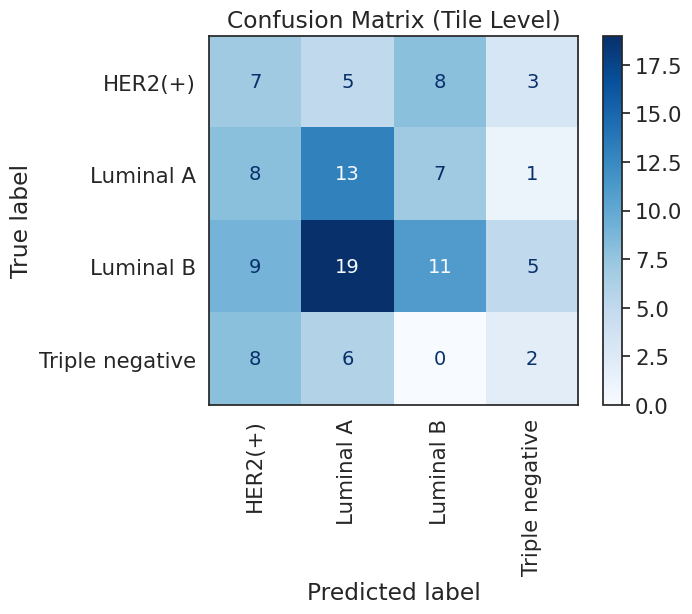

In [55]:
train_f1 = evaluate_macro_f1(best_model, train_ft_loader, device)
val_f1   = evaluate_macro_f1(best_model, val_ft_loader, device)
print(f"F1 TRAIN (macro): {train_f1:.4f}")
print(f"F1 VAL   (macro): {val_f1:.4f}")

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

def plot_confusion_matrix(model, loader, class_names, device):
    model.eval()
    y_true, y_pred = [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)
            y_true.extend(labels.cpu().tolist())
            y_pred.extend(preds.cpu().tolist())

    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

    plt.figure(figsize=(10, 10))
    disp.plot(cmap=plt.cm.Blues, xticks_rotation='vertical')
    plt.title("Confusion Matrix (Tile Level)")
    plt.show()

# Esegui dopo il check dell'F1
plot_confusion_matrix(best_model, val_ft_loader, class_names, device)


Inference on test_data


In [56]:
# IMPORTANTE: DEVI USARE LO STESSO DOWNSCALE FACTOR DEL TRAINING
DOWNSCALE_FACTOR = 1.4 # <--- Assicurati che sia identico a quello usato in train!
INPUT_SIZE = 192

# Cartelle
test_data_dir = f"{current_dir}/test_data"
test_expanded_dir = f"{current_dir}/test_data_expanded"

# Calcolo dimensione ritaglio (Coerenza con Training)
SOURCE_TILE_SIZE = int(INPUT_SIZE * DOWNSCALE_FACTOR)

def split_and_save_tiles_inference(img_name, src_dir, dst_dir):
    """
    Genera tiles per una singola immagine di test.
    Salva i file come: {nome_originale}_tile_{idx}.png
    Restituisce una lista di metadati per tenere traccia.
    """
    img_path = os.path.join(src_dir, img_name)
    # Cerca la maschera (assumiamo abbia prefisso 'mask_' invece di 'img_')
    mask_name = img_name.replace("img_", "mask_")
    mask_path = os.path.join(src_dir, mask_name)

    # Se non c'è la maschera (o l'immagine), saltiamo (ma nel test data dovrebbero esserci)
    if not os.path.exists(mask_path):
        print(f"Warning: Maschera non trovata per {img_name}")
        return []

    original_img = np.array(Image.open(img_path).convert("RGB"))
    original_mask = np.array(Image.open(mask_path).convert("L"))

    # 1. Macro Crop (Stessa logica del training)
    bbox = get_bbox(original_mask, padding=20) # Usa la tua funzione get_bbox definita prima
    if bbox is None: return [] # Maschera vuota?

    x1, y1, x2, y2 = bbox
    crop_img = original_img[y1:y2, x1:x2]
    crop_mask = original_mask[y1:y2, x1:x2]
    h_crop, w_crop = crop_img.shape[:2]

    # 2. Logica Tiling (Idem Training)
    SINGLE_LIMIT = SOURCE_TILE_SIZE * 1.5

    if w_crop > h_crop: # Orizzontale
        if h_crop < SINGLE_LIMIT:
            n_splits_h = 1
            n_splits_w = max(1, int(round(w_crop / h_crop)))
        else:
            n_splits_h = max(1, int(round(h_crop / SOURCE_TILE_SIZE)))
            n_splits_w = max(1, int(round(w_crop / SOURCE_TILE_SIZE)))
    else: # Verticale
        if w_crop < SINGLE_LIMIT:
            n_splits_w = 1
            n_splits_h = max(1, int(round(h_crop / w_crop)))
        else:
            n_splits_h = max(1, int(round(h_crop / SOURCE_TILE_SIZE)))
            n_splits_w = max(1, int(round(w_crop / SOURCE_TILE_SIZE)))

    step_h = h_crop // n_splits_h
    step_w = w_crop // n_splits_w

    tile_records = []
    tile_idx = 0

    for i in range(n_splits_h):
        for j in range(n_splits_w):
            ty1 = i * step_h
            tx1 = j * step_w
            ty2 = (i + 1) * step_h if i < n_splits_h - 1 else h_crop
            tx2 = (j + 1) * step_w if j < n_splits_w - 1 else w_crop

            if n_splits_h > 1: ty2 = min(h_crop, ty2 + 20)
            if n_splits_w > 1: tx2 = min(w_crop, tx2 + 20)

            tile_img = crop_img[ty1:ty2, tx1:tx2]
            tile_mask = crop_mask[ty1:ty2, tx1:tx2]

            # 3. Check Quantità ROI (Stesso filtro del training)
            if tile_mask.size == 0: continue
            roi_ratio = np.count_nonzero(tile_mask) / tile_mask.size
            if roi_ratio < MIN_MASK_RATIO: continue

            # 4. Refine Crop
            sub_bbox = get_bbox(tile_mask, padding=10)
            final_img = tile_img
            if sub_bbox:
                sx1, sy1, sx2, sy2 = sub_bbox
                if (sx2-sx1) > MIN_TILE_SIDE and (sy2-sy1) > MIN_TILE_SIDE:
                    final_img = tile_img[sy1:sy2, sx1:sx2]

            if final_img.shape[0] < MIN_TILE_SIDE or final_img.shape[1] < MIN_TILE_SIDE: continue

            # --- SALVATAGGIO PER INFERENCE ---
            # Nome file: img_0155_tile_00.png
            # Rimuoviamo l'estensione .png dal nome originale per costruire il nuovo nome
            base_name = os.path.splitext(img_name)[0]
            new_tile_name = f"{base_name}_tile_{tile_idx:02d}.png"

            Image.fromarray(final_img).save(os.path.join(dst_dir, new_tile_name))

            tile_records.append({
                "tile_name": new_tile_name,
                "original_sample": img_name # Fondamentale per raggruppare dopo!
            })
            tile_idx += 1

    return tile_records

# --- ESECUZIONE GENERAZIONE TILES INFERENCE ---
if GENERATE_TILES_INF:
    print(">>> Generazione Tiles per Inference...")
    if os.path.exists(test_expanded_dir): shutil.rmtree(test_expanded_dir)
    os.makedirs(test_expanded_dir)

    # Lista di tutti i file di test originali
    test_files = sorted([f for f in os.listdir(test_data_dir) if f.startswith("img_")])

    all_test_tiles = []
    for img_name in test_files:
        tiles_metadata = split_and_save_tiles_inference(img_name, test_data_dir, test_expanded_dir)
        all_test_tiles.extend(tiles_metadata)

    # Creiamo un DataFrame che mappa Tile -> Immagine Originale
    test_tiles_df = pd.DataFrame(all_test_tiles)
    # Salviamo questo CSV temporaneo, ci serve per il DataLoader
    test_tiles_df.to_csv(os.path.join(test_expanded_dir, "test_map.csv"), index=False)
    print(f"Generato {len(test_tiles_df)} tiles da {len(test_files)} immagini originali.")
else:
    print(">>> Loading Tiles Inference esistenti...")
    test_tiles_df = pd.read_csv(os.path.join(test_expanded_dir, "test_map.csv"))

print("Mappa Test Tiles pronta.")
test_tiles_df.head()

>>> Generazione Tiles per Inference...
Generato 652 tiles da 477 immagini originali.
Mappa Test Tiles pronta.


,tile_name,original_sample
0,img_0000_tile_00.png,img_0000.png
1,img_0002_tile_00.png,img_0002.png
2,img_0002_tile_01.png,img_0002.png
3,img_0002_tile_02.png,img_0002.png
4,img_0002_tile_03.png,img_0002.png


In [57]:
class MaskedInferenceDataset(Dataset):
    def __init__(self, img_dir, transform=None, padding=10):
        self.img_dir = img_dir
        self.transform = transform
        self.padding = padding

        self.images = sorted([
            f for f in os.listdir(img_dir)
            if f.startswith("img_")
        ])
        self.files = self.images

    def _get_bbox_from_mask(self, mask):
        ys, xs = np.where(mask > 0)
        if len(xs) == 0:
            return None
        return xs.min(), ys.min(), xs.max(), ys.max()

    def __getitem__(self, idx):
        img_name = self.images[idx]
        mask_name = img_name.replace("img_", "mask_")

        img_path  = os.path.join(self.img_dir, img_name)
        mask_path = os.path.join(self.img_dir, mask_name)

        image = np.array(Image.open(img_path).convert("RGB"))
        mask  = np.array(Image.open(mask_path).convert("L"))

        bbox = self._get_bbox_from_mask(mask)
        if bbox is not None:
            x1, y1, x2, y2 = bbox
            h, w = image.shape[:2]
            image = image[
                max(0, y1 - self.padding):min(h, y2 + self.padding),
                max(0, x1 - self.padding):min(w, x2 + self.padding)
            ]

        image = Image.fromarray(image)
        if self.transform:
            image = self.transform(image)

        return image, img_name

    def __len__(self):
        return len(self.images)


In [58]:
import torch.nn.functional as F

# 1. Dataset per le Tiles di Inference
class TileInferenceDataset(Dataset):
    def __init__(self, dataframe, img_dir, transform=None):
        self.df = dataframe
        self.img_dir = img_dir
        self.transform = transform

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_name = row["tile_name"]
        orig_name = row["original_sample"]

        img_path = os.path.join(self.img_dir, img_name)
        image = Image.open(img_path).convert("RGB")

        # QUI AVVIENE IL RESIZE a 192x192 grazie a val_transform
        if self.transform:
            image = self.transform(image)

        return image, orig_name # Restituiamo il nome originale per raggruppare

    def __len__(self):
        return len(self.df)



In [59]:
# Loader
test_dataset = TileInferenceDataset(test_tiles_df, test_expanded_dir, transform=val_transform)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4)

# 2. Prediction Loop (Salva le probabilità, non solo la classe!)
print(">>> Avvio Inference sulle Tiles...")
best_model.eval()

results = []

with torch.no_grad():
    for images, orig_names in test_loader:
        images = images.to(device)
        outputs = best_model(images)

        # Calcoliamo le probabilità con Softmax
        probs = F.softmax(outputs, dim=1) # Shape: [Batch, Num_Classes]

        # Salviamo tutto in una lista per processarlo con Pandas
        probs_np = probs.cpu().numpy()

        for i in range(len(orig_names)):
            results.append({
                "original_sample": orig_names[i],
                "probs": probs_np[i] # Array di probabilità per questa tile
            })

# 3. Aggregazione (Majority/Soft Voting)
print(">>> Aggregazione risultati...")

# Creiamo un DF temporaneo con i risultati
results_df = pd.DataFrame(results)

# A. Raggruppiamo per immagine originale
# B. Calcoliamo la MEDIA delle probabilità di tutte le tiles appartenenti alla stessa immagine
#    (Questo è molto meglio del voto di maggioranza semplice)
aggregated_df = results_df.groupby("original_sample")["probs"].apply(lambda x: np.mean(np.vstack(x), axis=0)).reset_index()

# C. Argmax finale sulla media delle probabilità
aggregated_df["final_class_idx"] = aggregated_df["probs"].apply(lambda x: np.argmax(x))
aggregated_df["label"] = aggregated_df["final_class_idx"].apply(lambda x: class_names[x])

# 4. Creazione Submission Finale
# Assicuriamoci di includere TUTTE le immagini di test, anche quelle che (per assurdo) non hanno generato tiles
# (es. maschera nera). In quel caso avremmo un buco.
# Recuperiamo la lista originale dei file test
all_test_files = sorted([f for f in os.listdir(test_data_dir) if f.startswith("img_")])
final_submission = pd.DataFrame({"sample_index": all_test_files})

# Uniamo con le predizioni
final_submission = final_submission.merge(aggregated_df[["original_sample", "label"]],
                                          left_on="sample_index",
                                          right_on="original_sample",
                                          how="left")

# Gestione casi mancanti (se una maschera era vuota e non ha generato tiles)
# Assegnamo una classe di default (es. quella più frequente nel train) o una a caso.
# Qui metto la prima classe come fallback.
final_submission["label"] = final_submission["label"].fillna(class_names[0])

# Pulizia colonne
final_submission = final_submission[["sample_index", "label"]]

# Salvataggio
os.makedirs(os.path.join(current_dir, "submission"), exist_ok=True)
submission_path = os.path.join(current_dir, "submission", "EfficientNet_Tiles_Training_lowaugtrain.csv")
final_submission.to_csv(submission_path, index=False)

print(f"Submission salvata in: {submission_path}")
print(f"Totale righe: {len(final_submission)}")
print(final_submission.head())



>>> Avvio Inference sulle Tiles...
>>> Aggregazione risultati...
Submission salvata in: /gdrive/My Drive/AN2DL_2chall/submission/EfficientNet_Tiles_Training_lowaugtrain.csv
Totale righe: 477
   sample_index      label
0  img_0000.png  Luminal B
1  img_0001.png    HER2(+)
2  img_0002.png  Luminal B
3  img_0003.png  Luminal A
4  img_0004.png  Luminal A


In [60]:
# ==========================================
# X. PULIZIA FINALE (Rimozione Cartelle Tiles)
# ==========================================

# Assicurati di aver definito ELIMINATE_EXTENDED_DATASETS_AFTER = True all'inizio
if ELIMINATE_EXTENDED_DATASETS_AFTER:
    print("\n>>> PULIZIA CARTELLE ESPANSE (ELIMINATE_EXTENDED_DATASETS_AFTER = True)...")

    # Definisco esplicitamente i percorsi che vuoi controllare
    train_expanded_dir = f"{current_dir}/train_data_expanded"
    test_expanded_dir = f"{current_dir}/test_data_expanded"

    # Lista delle cartelle da processare
    dirs_to_clean = [train_expanded_dir, test_expanded_dir]

    for d in dirs_to_clean:
        # 1. Controlla se la cartella esiste prima di provare a cancellarla
        if os.path.exists(d):
            try:
                # 2. Cancella l'intera cartella e il suo contenuto
                shutil.rmtree(d)
                print(f"✔ Eliminata con successo: {d}")
            except Exception as e:
                print(f"❌ Errore durante l'eliminazione di {d}: {e}")
        else:
            print(f"⚠ Cartella non trovata (già assente): {d}")

    print(">>> Operazioni di pulizia completate.")